In [204]:
%qtconsole

In [205]:
%pip install deeptrack==0.11.3

import numpy as np
import deeptrack as dt
import matplotlib.pyplot as plt
plt.style.use('default')

Note: you may need to restart the kernel to use updated packages.


In [206]:
IMAGE_SIZE = 256
SAMPLE_THICKNESS = 300

Om man väljer partikelradien till en meter, varför ser det normalt ut?

In [207]:
particle = dt.MieSphere(
    position = (IMAGE_SIZE / 2, IMAGE_SIZE / 2) + np.random.rand(2) * 4 - 2, #lambda: (IMAGE_SIZE / 2, IMAGE_SIZE / 2) + np.random.rand(2) * IMAGE_SIZE - IMAGE_SIZE / 2,
    z = lambda: np.random.uniform(-SAMPLE_THICKNESS / 2, SAMPLE_THICKNESS / 2),
    radius = lambda: (1e-7 + 3e-7 * np.random.rand()),
    refractive_index = lambda: np.random.rand() * 0.3 + 1.37,
    L = 8,
    position_unit = 'pixel'
)

In [208]:
HC = dt.HorizontalComa(coefficient= lambda c1: c1, c1 = 0 + np.random.randn() * 0.05)
VC = dt.VerticalComa(coefficient= lambda c2: c2, c2 = 0 + np.random.randn() * 0.05)

def crop(pupil_radius):
    def inner(image):
        x = np.arange(image.shape[0]) - image.shape[0] / 2
        y = np.arange(image.shape[1]) - image.shape[1] / 2
        X, Y = np.meshgrid(x, y)
        image[X ** 2 + Y ** 2 > pupil_radius ** 2] = 0
        return image
    return inner

CROP = dt.Lambda(crop, pupil_radius = 23)

optics = dt.Brightfield(
    NA = 1.3,
    resolution = 1.13e-6,
    wavelength= 635e-9,
    aperture_angle= 53.7 * 2 * np.pi / 360,
    polarization_angle= lambda: np.random.rand() * 2 * np.pi,
    magnification= 10,
    output_region= (0, 0, IMAGE_SIZE, IMAGE_SIZE),
    padding= (64,) * 4,
    return_field = True,
    pupil = HC + VC + CROP
)

In [209]:
real_noise = dt.Gaussian(
    mu = 0,
    sigma = lambda level: np.random.rand() * 0.02
)

noise = real_noise + dt.Gaussian(
    mu = 0,
    sigma = lambda real_sigma: real_sigma * 0.03j,
    real_sigma = real_noise.sigma
)

def func():
    def inner(image):
        image = (image - 1)
        output = np.zeros((*image.shape[:2], 2))
        output[..., 0:1] = np.real(image)
        output[..., 1:2] = np.imag(image)
        return output
    return inner

complex_to_float = dt.Lambda(func)

In [210]:
dataset = optics(particle**1 + noise) + complex_to_float

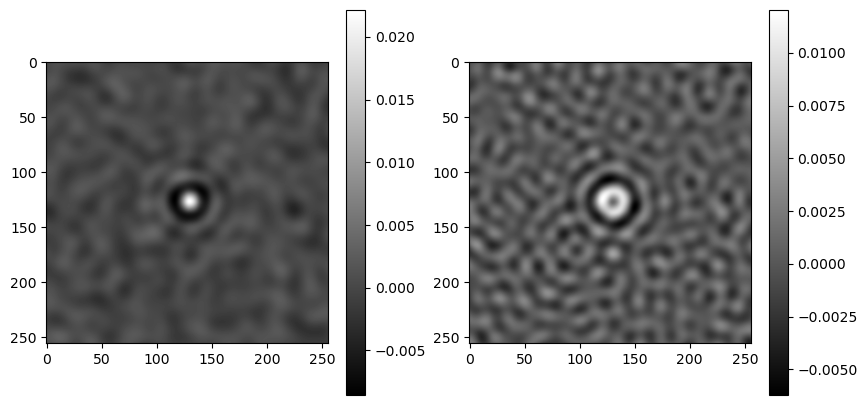

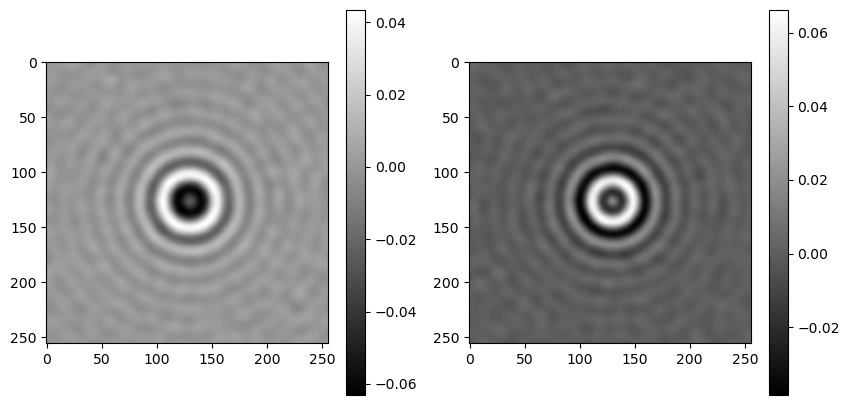

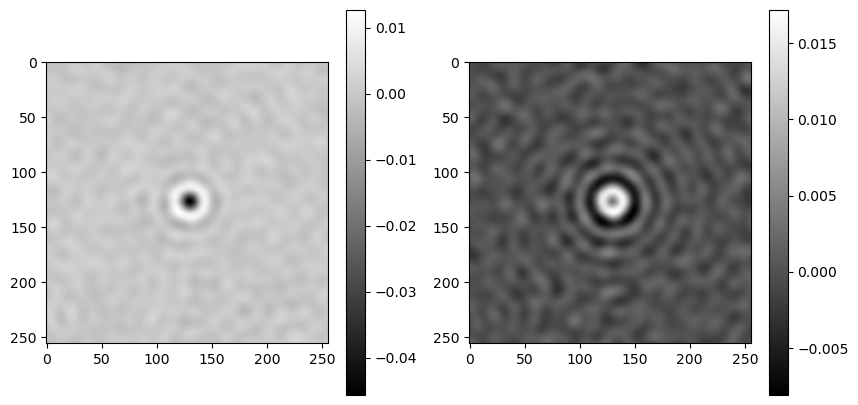

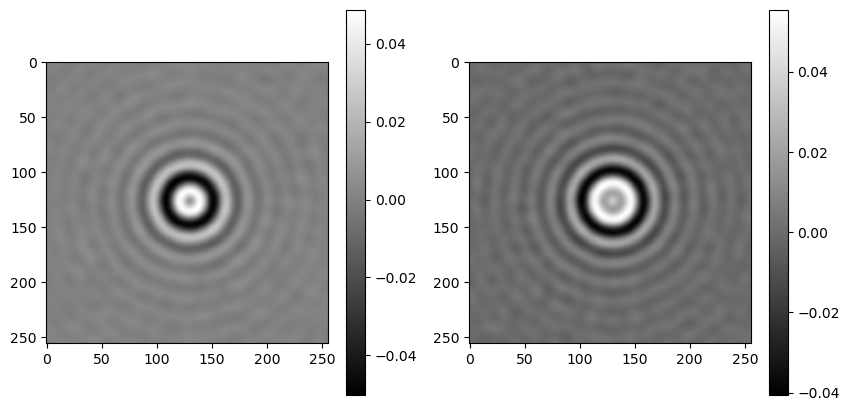

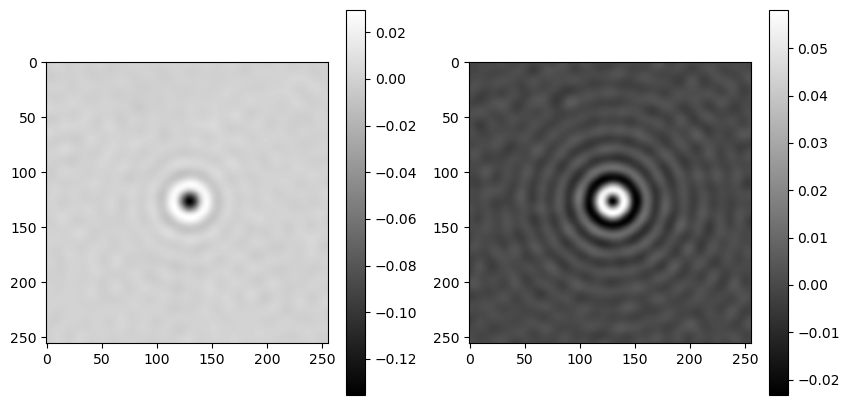

...

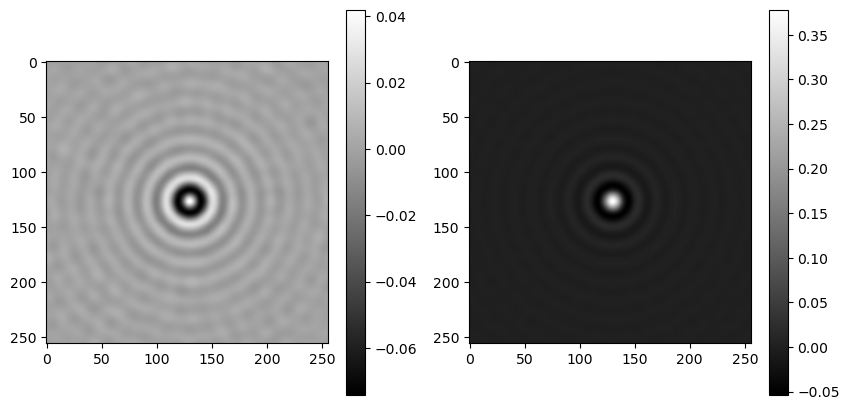

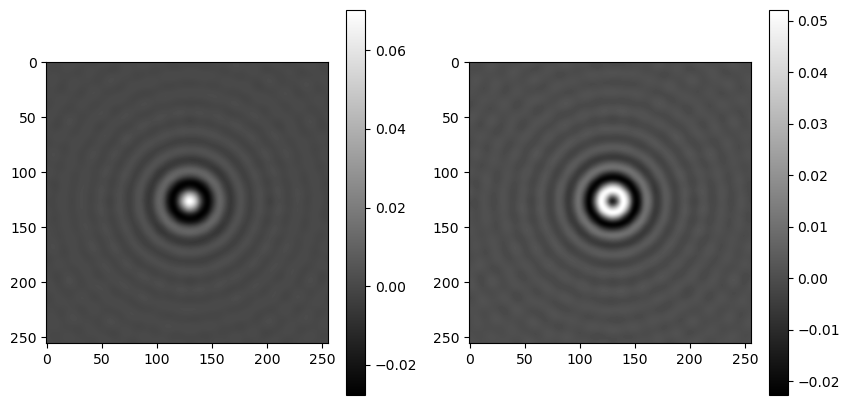

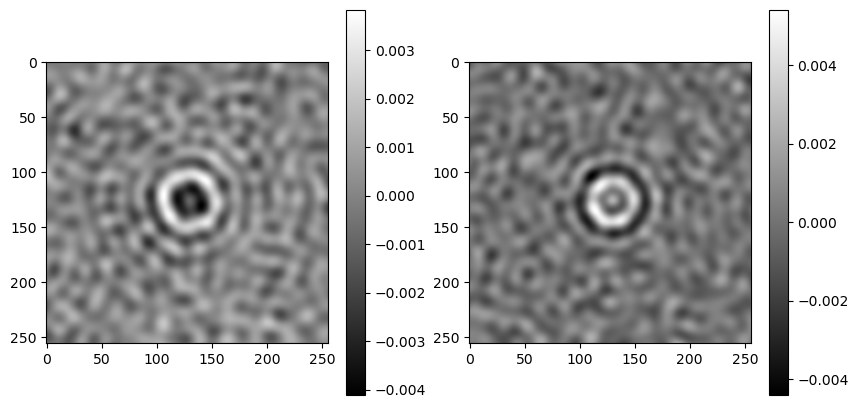

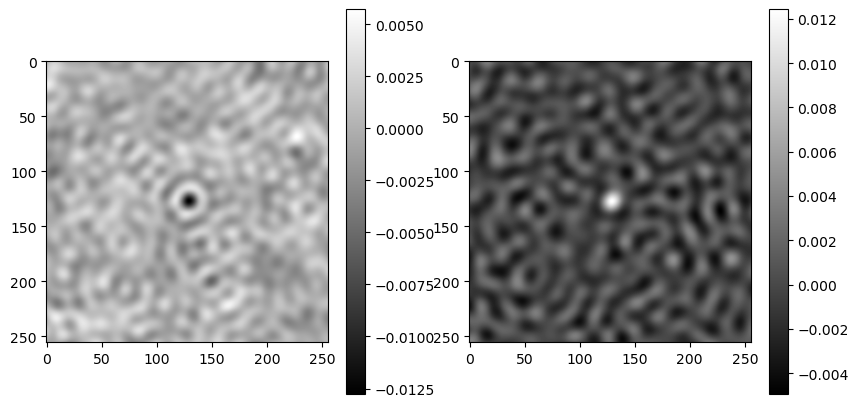

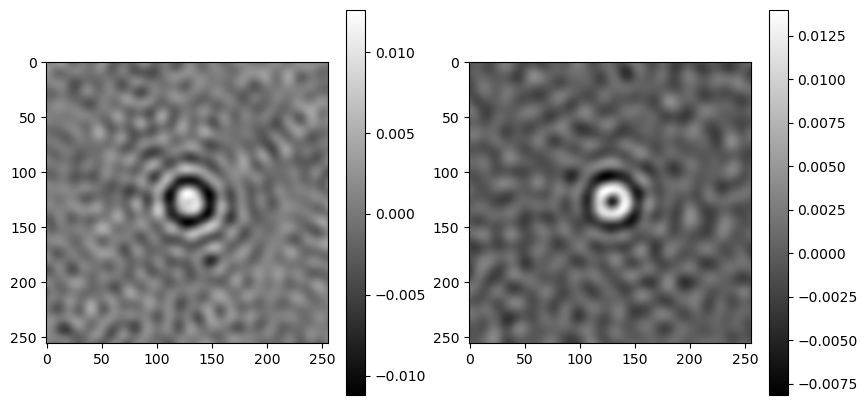

In [211]:
for i in range(16):
    dataset.update()
    image_of_particle = dataset.resolve()

    plt.figure(figsize = (10, 5))
    
    plt.subplot(1,2,1)
    plt.imshow(image_of_particle[:, :, 0], cmap = 'gray')
    plt.colorbar()

    plt.subplot(1,2,2)
    plt.imshow(image_of_particle[:, :, 1], cmap = 'gray')
    plt.colorbar()
    
    plt.show()

### 2. Network design

In [212]:
def get_label(image):
    z = (image.get_property('z') + SAMPLE_THICKNESS / 2) / SAMPLE_THICKNESS
    return z

In [213]:
import keras.backend as K
import keras.optimizers as optimizers

model = dt.models.Convolutional(
    input_shape= (IMAGE_SIZE, IMAGE_SIZE, 2),
    conv_layers_dimensions= (32, 64, 128),
    dense_layers_dimensions= (64, 64),
    steps_per_pooling= 2,
    number_of_outputs= 1,
    dropout= (.2, .2),
    loss= 'mae',
    optimizer= 'adam',
    dense_block= dt.layers.DenseBlock(activation='relu')
)

model.summary()

Model: "model_163"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 2)]     0         
                                                                 
 conv2d_6 (Conv2D)           (None, 256, 256, 32)      608       
                                                                 
 activation_8 (Activation)   (None, 256, 256, 32)      0         
                                                                 
 conv2d_7 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 activation_9 (Activation)   (None, 256, 256, 32)      0         
                                                                 
 spatial_dropout2d_2 (Spatia  (None, 256, 256, 32)     0         
 lDropout2D)                                                     
                                                         

In [214]:
from tensorflow.keras.callbacks import EarlyStopping

validation_set_size = 256
validation_set = [dataset.update().resolve() for _ in range(validation_set_size)]
validation_labels = [get_label(image) for image in validation_set]

In [215]:
generator = dt.generators.ContinuousGenerator(
    dataset,
    get_label,
    min_data_size= int(64),
    max_data_size= int(2e4),
    batch_size= 64
)

totalhistory = {"training_loss": [], "validation_loss": [], "epoch": [], "validation_predictions": []}

Generating 65 / 64 samples before starting training
1/1 [==============================] - 22s 22s/step - loss: 0.5206 - val_loss: 0.3747


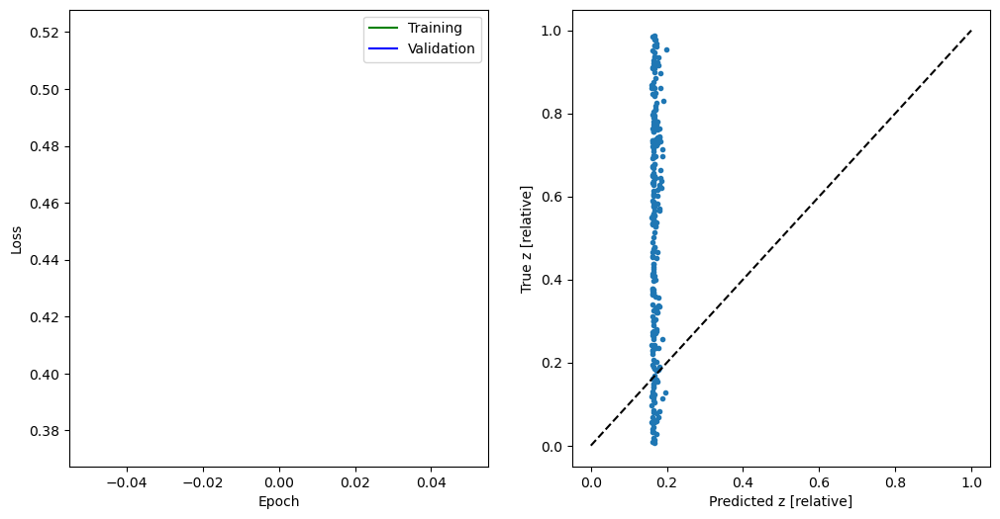

Generating 119 / 64 samples before starting training
1/1 [==============================] - 20s 20s/step - loss: 0.3231 - val_loss: 1.0321


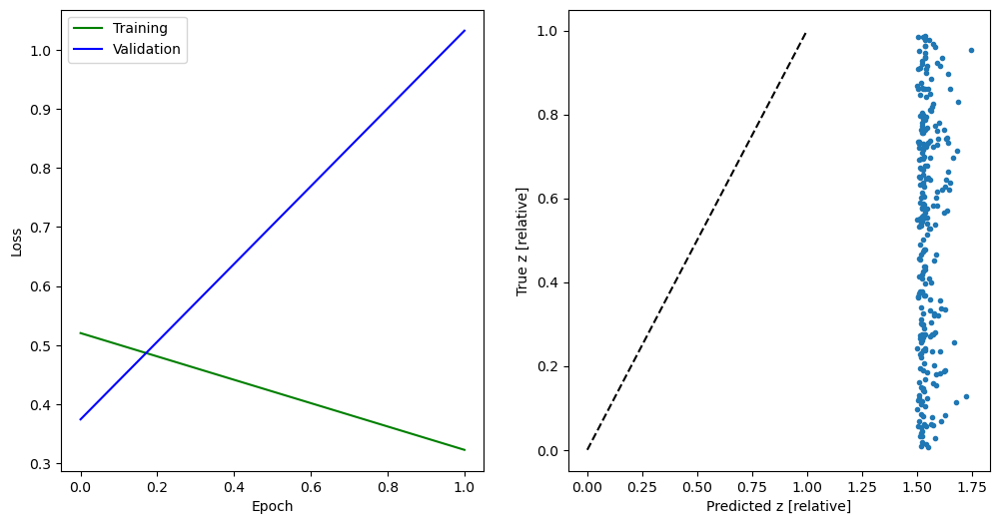

Generating 167 / 64 samples before starting training
2/2 [==============================] - 27s 18s/step - loss: 0.7123 - val_loss: 0.4180


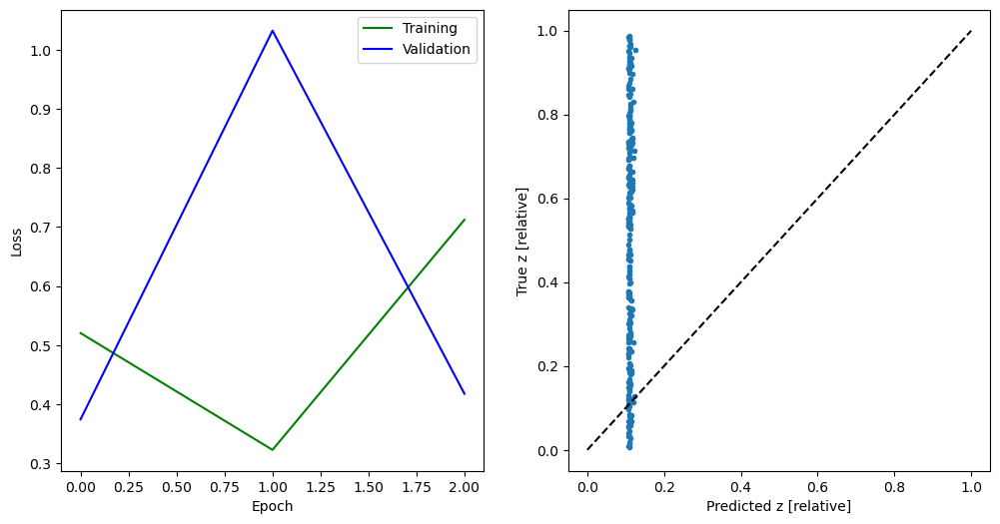

Generating 237 / 64 samples before starting training
3/3 [==============================] - 41s 14s/step - loss: 0.3844 - val_loss: 0.3768


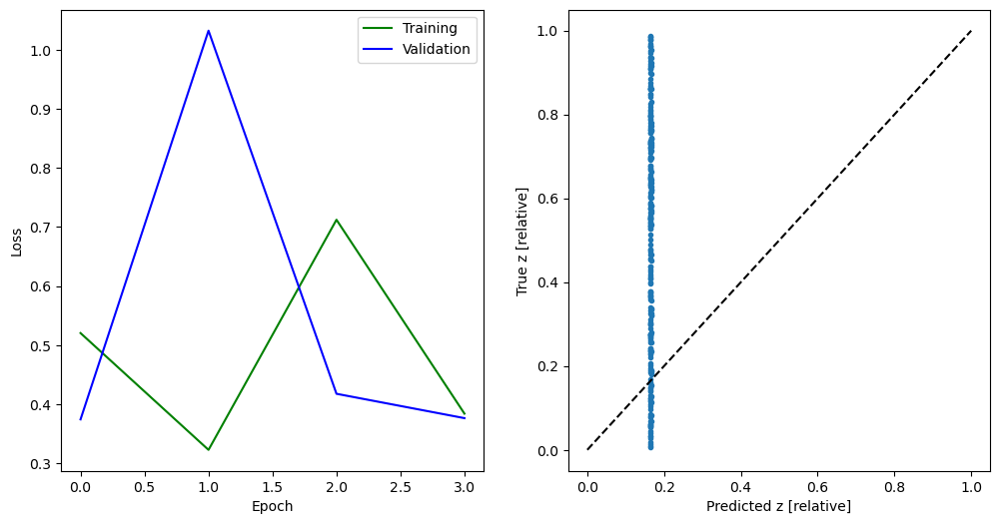

Generating 328 / 64 samples before starting training
5/5 [==============================] - 51s 11s/step - loss: 0.2958 - val_loss: 0.2425


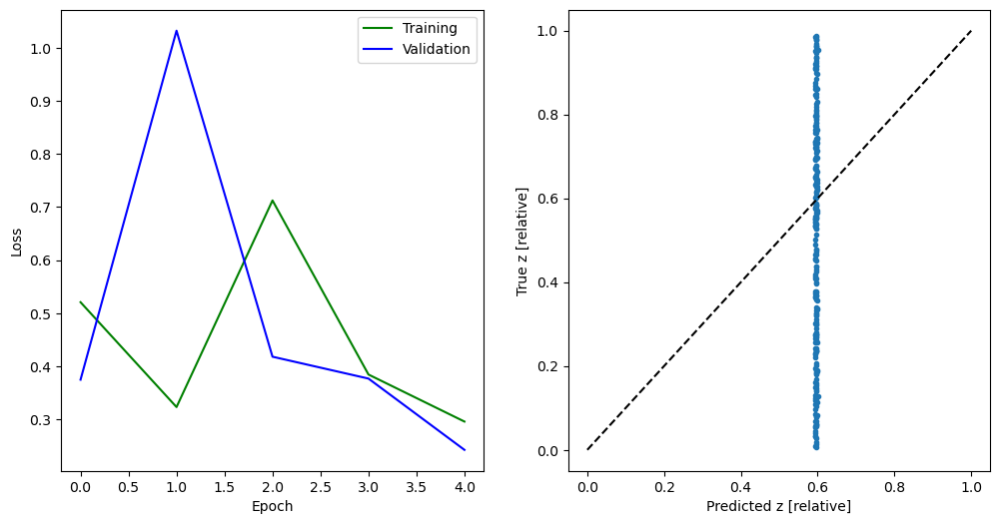

Generating 460 / 64 samples before starting training
7/7 [==============================] - 74s 11s/step - loss: 0.2470 - val_loss: 0.2564


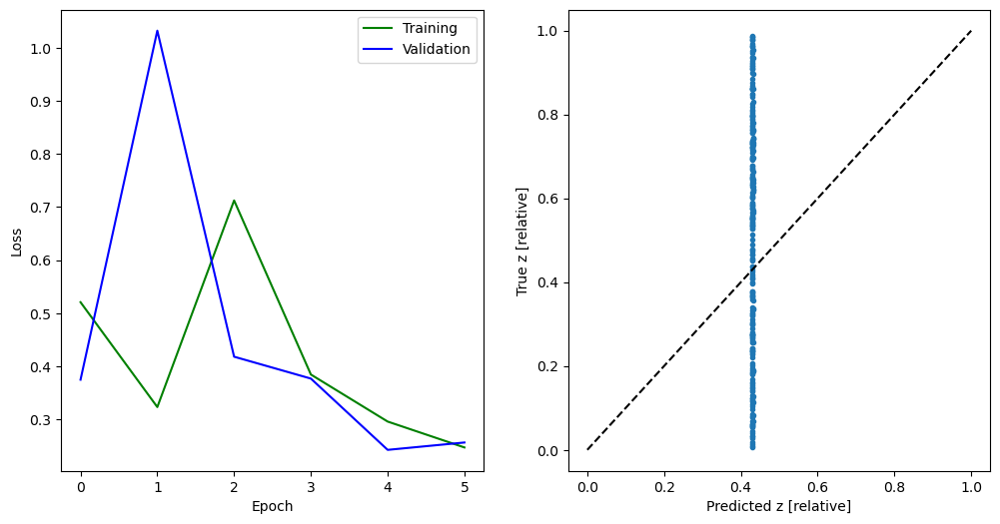

Generating 633 / 64 samples before starting training
9/9 [==============================] - 94s 10s/step - loss: 0.2443 - val_loss: 0.2487


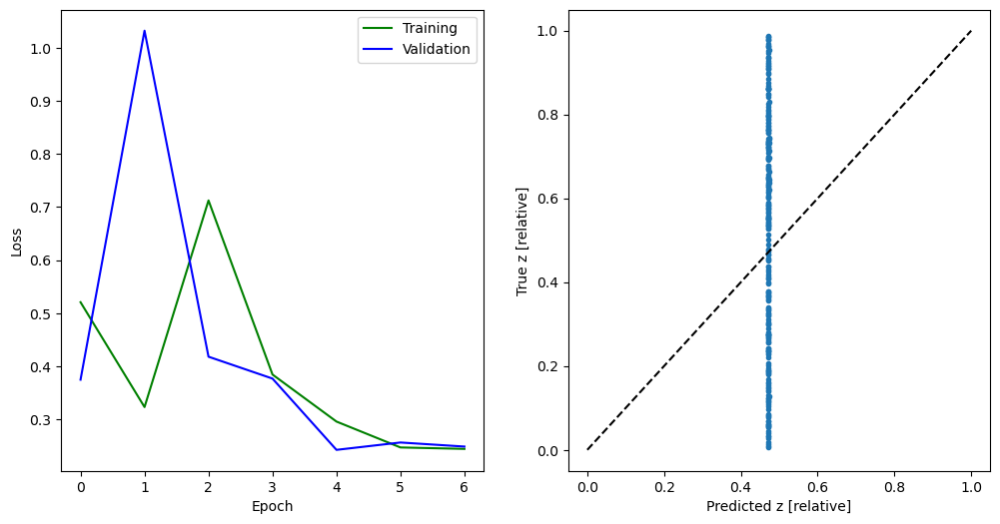

Generating 845 / 64 samples before starting training
13/13 [==============================] - 117s 9s/step - loss: 0.2473 - val_loss: 0.2501


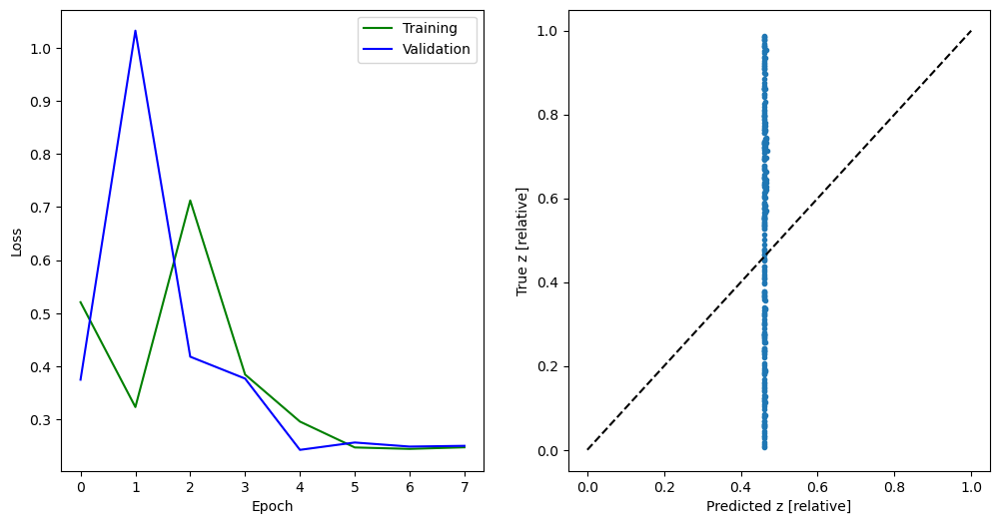

Generating 1145 / 64 samples before starting training
17/17 [==============================] - 156s 9s/step - loss: 0.2449 - val_loss: 0.2429


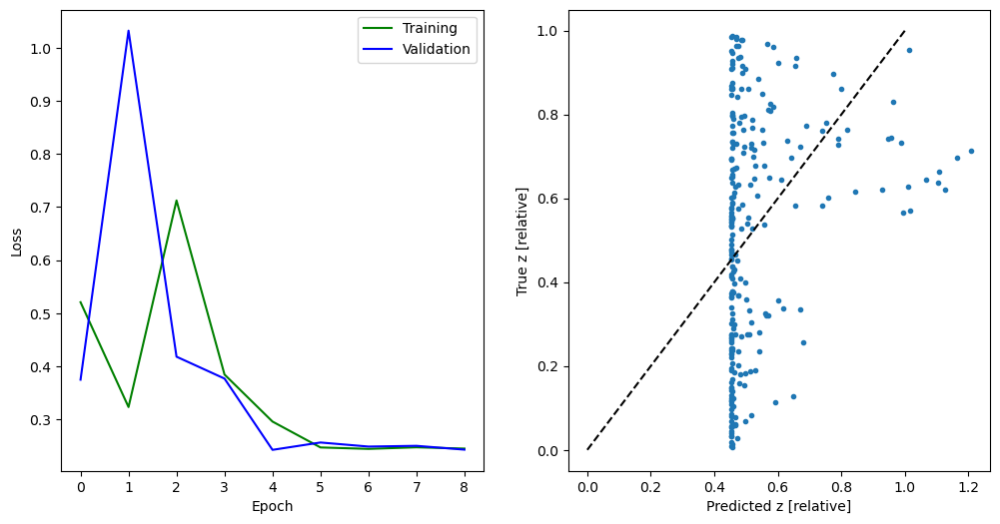

Generating 1529 / 64 samples before starting training
23/23 [==============================] - 205s 9s/step - loss: 0.2479 - val_loss: 0.2194


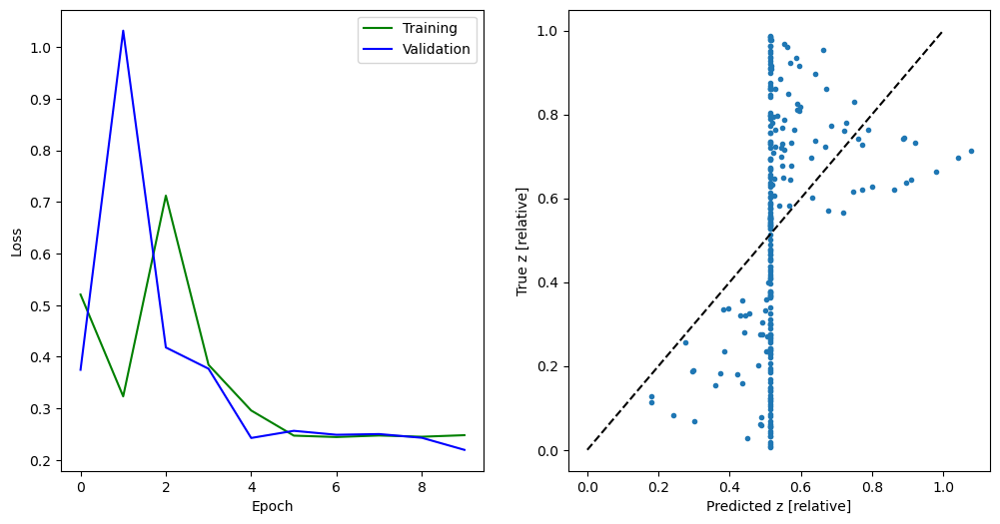

Generating 2036 / 64 samples before starting training
31/31 [==============================] - 284s 9s/step - loss: 0.1713 - val_loss: 0.1339


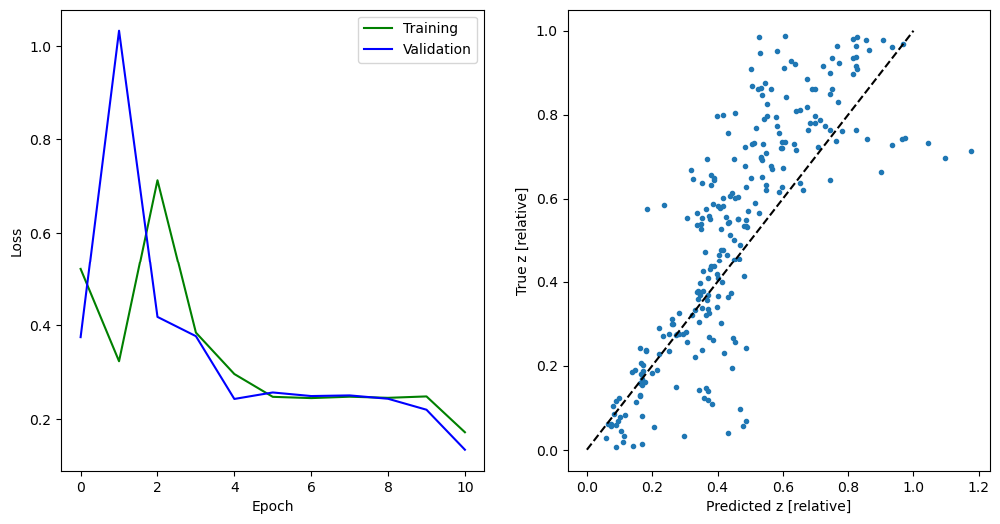

Generating 2706 / 64 samples before starting training
42/42 [==============================] - 394s 9s/step - loss: 0.1070 - val_loss: 0.0786


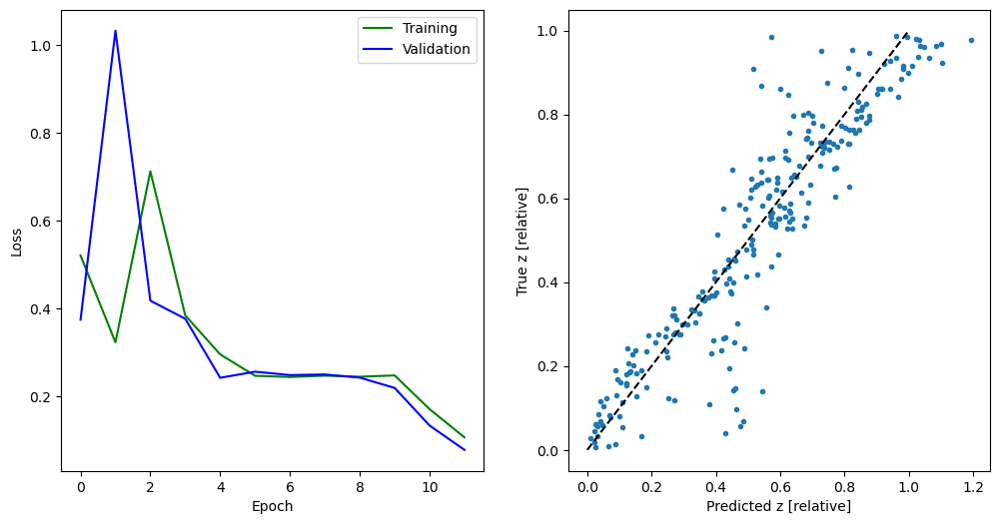

Generating 3596 / 64 samples before starting training
56/56 [==============================] - 535s 10s/step - loss: 0.0770 - val_loss: 0.0623


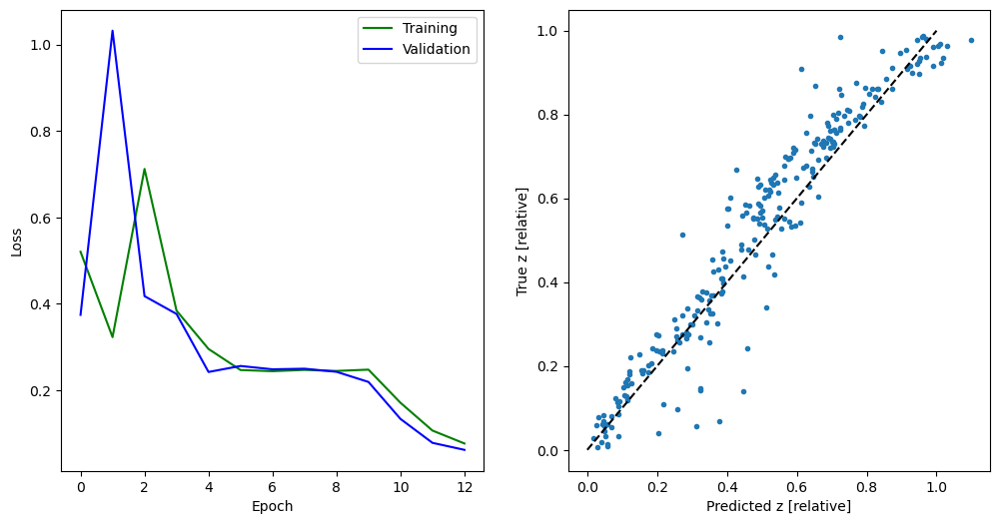

Generating 4774 / 64 samples before starting training
74/74 [==============================] - 696s 9s/step - loss: 0.0574 - val_loss: 0.0369


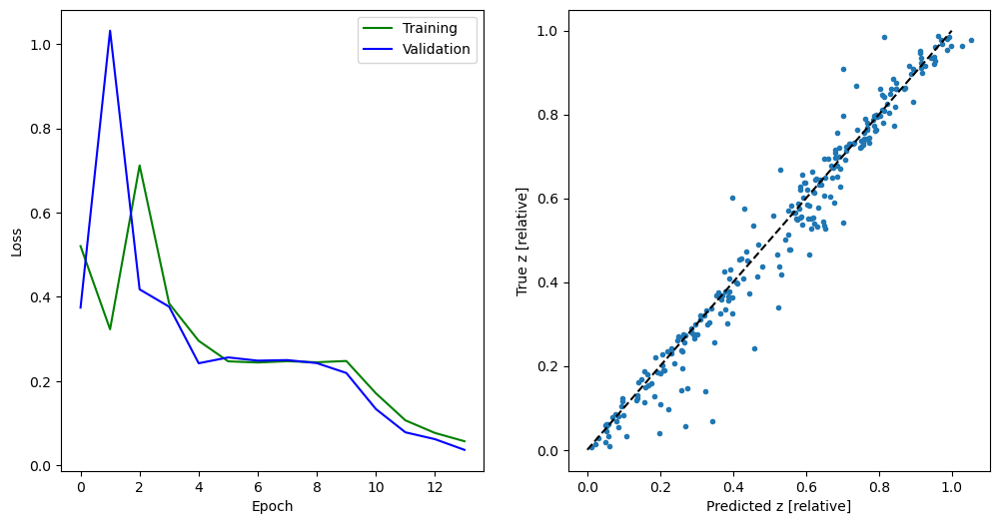

Generating 6341 / 64 samples before starting training
 2/99 [..............................] - ETA: 14:27 - loss: 0.0398

KeyboardInterrupt: 

In [216]:
EPOCHS_BETWEEN_PLOTS = 1
EPOCHS_TO_TRAIN = 10000*EPOCHS_BETWEEN_PLOTS

for i in range(0, EPOCHS_TO_TRAIN, EPOCHS_BETWEEN_PLOTS):
    with generator:
        h = model.fit(
            generator,
            validation_data= (np.array(validation_set), np.array(validation_labels)),
            epochs= EPOCHS_BETWEEN_PLOTS
        )

    totalhistory["validation_loss"].extend(h.history["val_loss"])
    totalhistory["training_loss"].extend(h.history["loss"])
    totalhistory["epoch"].extend(list(range(i, i+EPOCHS_BETWEEN_PLOTS)))
    totalhistory["validation_predictions"].append(model.predict(np.array(validation_set)))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 6))
    
    ax1.plot(totalhistory["epoch"], totalhistory["training_loss"], 'g', label = "Training")
    ax1.plot(totalhistory["epoch"], totalhistory["validation_loss"], 'b', label = "Validation")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.legend()

    ax2.plot(totalhistory["validation_predictions"][i], validation_labels, '.')
    ax2.plot(
        np.linspace(0, 1),
        np.linspace(0, 1),
        'k--')
    ax2.set_xlabel("Predicted z [relative]")
    ax2.set_ylabel("True z [relative]")

    plt.show()


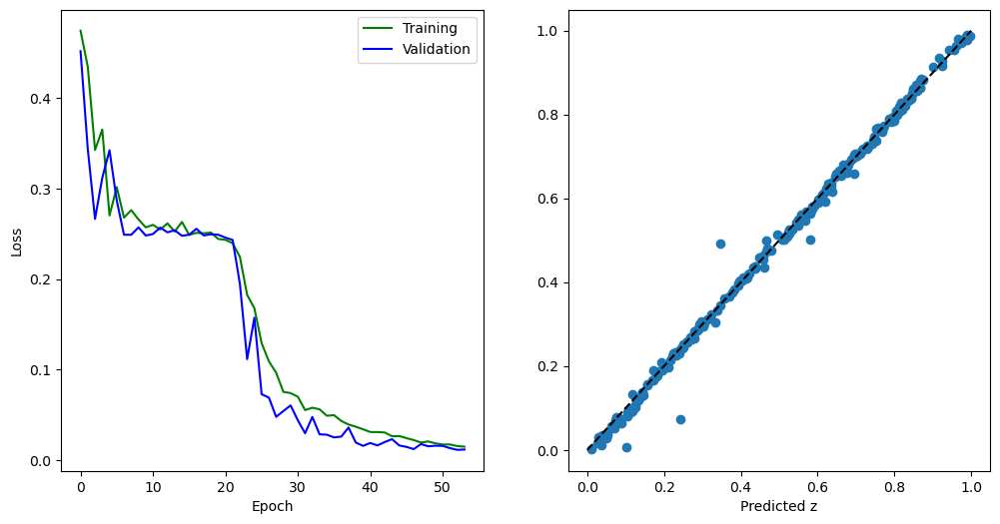

In [ ]:
import matplotlib.animation as animation

figure, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 6))

x = np.linspace(0,1)

ax2.plot(x, x, 'k--')

def animate(i):
    ax1.clear()
    ax1.plot(totalhistory["epoch"][:i], totalhistory["training_loss"][:i], 'g', label = "Training")
    ax1.plot(totalhistory["epoch"][:i], totalhistory["validation_loss"][:i], 'b', label = "Validation")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.legend()

    #if i == 0:
    #    ax1.legend()

    ax2.clear()
    ax2.set_xlabel("Predicted z")
    ax2.plot(x, x, 'k--')
    ax2.scatter(totalhistory["validation_predictions"][i], validation_labels)

myAnimation = animation.FuncAnimation(figure, animate, frames= len(totalhistory["validation_predictions"]), interval= 150)
myAnimation.save("mymovie.mp4")

## Visualizing featuremaps

In [244]:
for layer in model.layers:
    if 'conv' not in layer.name:
        continue

    filters, biases = layer.get_weights()
    f_min, f_max = filters.min(), filters.max()
    filters = (filters - f_min) / (f_max - f_min)
    print(layer.name, filters.shape)

    n_filters, ix = 6, 1
    for i in range(n_filters):
        f = filters[:, :, :, i]
        n_chanels = 2
        for j in range(n_chanels): # TODO: why not 3?
            ax = plt.subplot(n_filters, n_chanels, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            plt.imshow(f[:, :, j], cmap='gray')
            ix += 1
    plt.show()

conv2d_6 (3, 3, 2, 32)


AttributeError: 'AxesSubplot' object has no property 'figsize'

<Figure size 640x480 with 0 Axes>

In [ ]:
for i in range(len(model.layers)):
    layer = model.layers[i]

    if 'conv' not in layer.name:
        continue
    print(i, layer.name, layer.output.shape)
    

1 conv2d (None, 64, 64, 32)
3 conv2d_1 (None, 64, 64, 32)
7 conv2d_2 (None, 32, 32, 64)
9 conv2d_3 (None, 32, 32, 64)
13 conv2d_4 (None, 16, 16, 128)
15 conv2d_5 (None, 16, 16, 128)


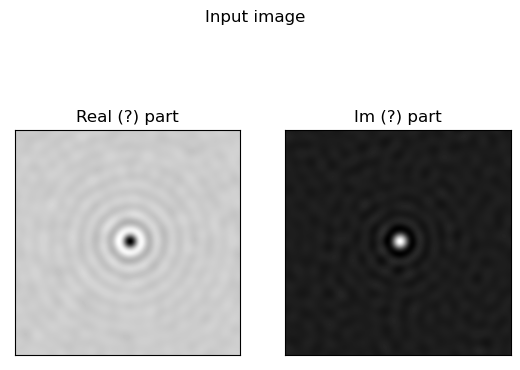

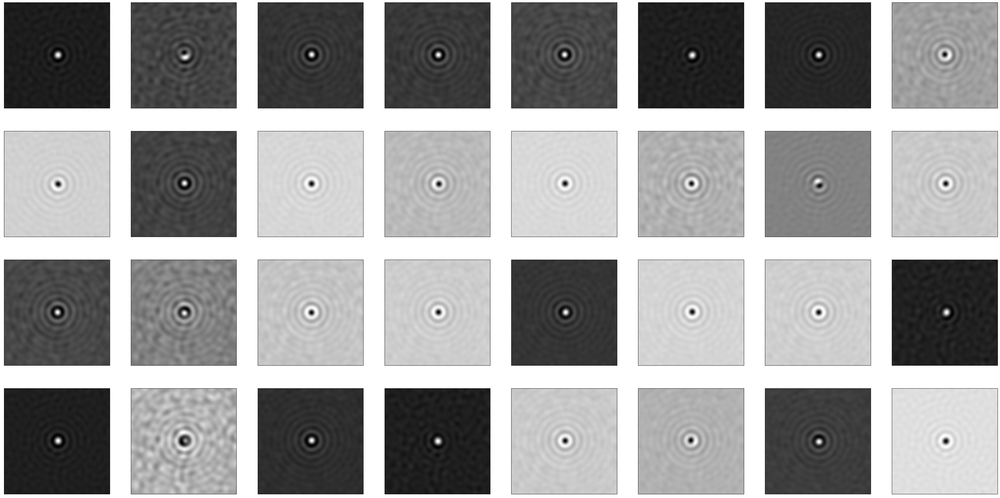

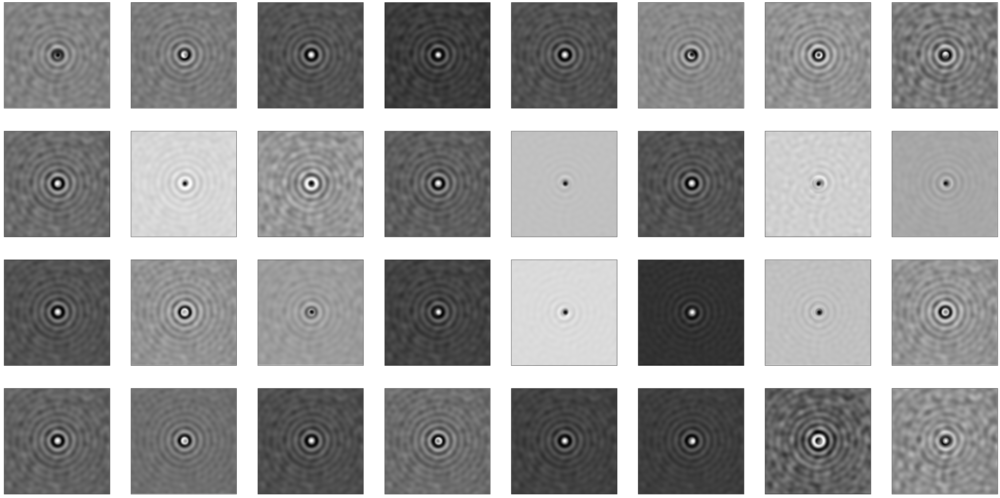

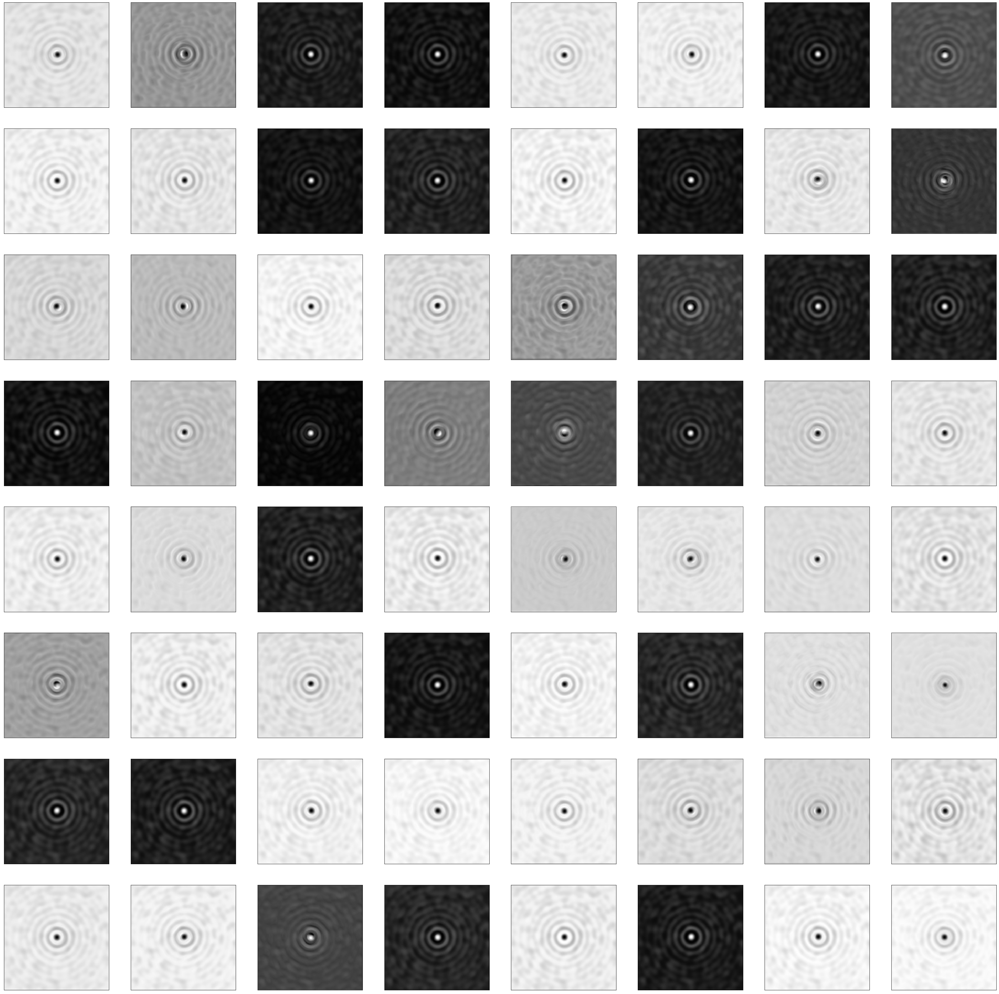

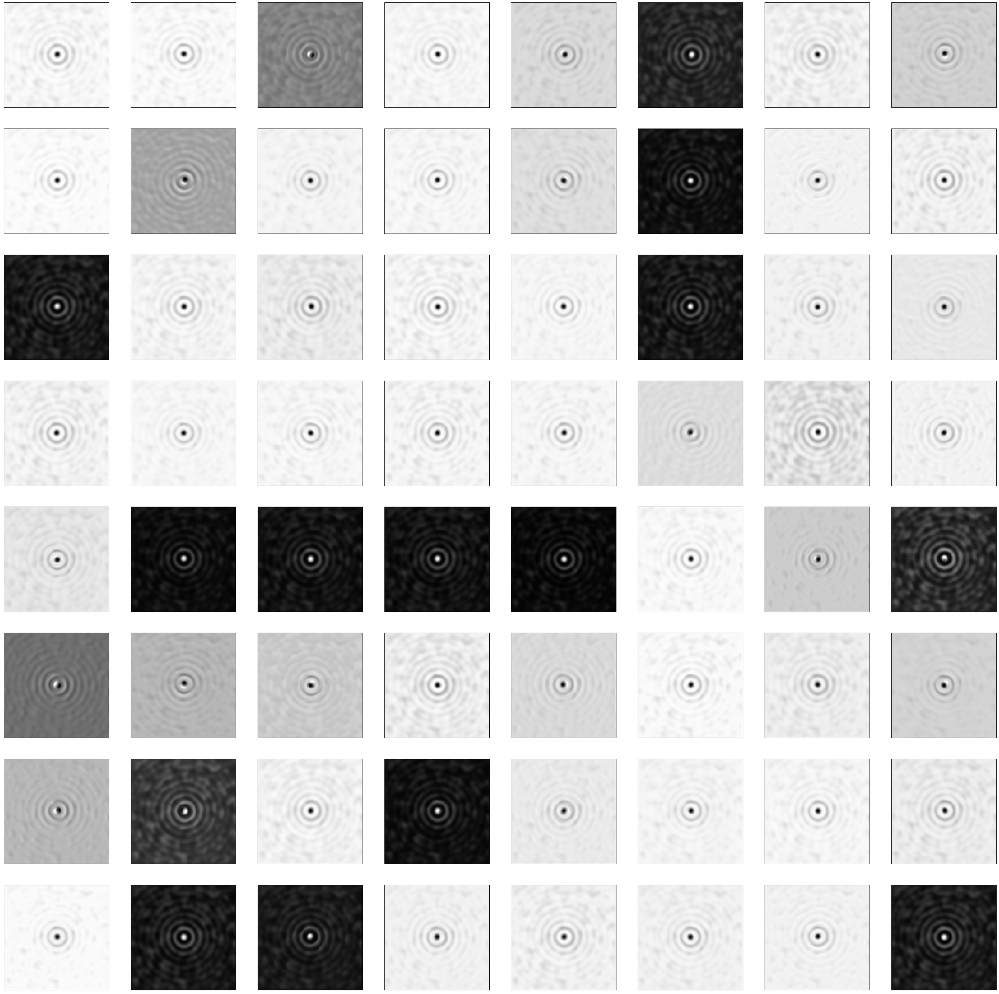

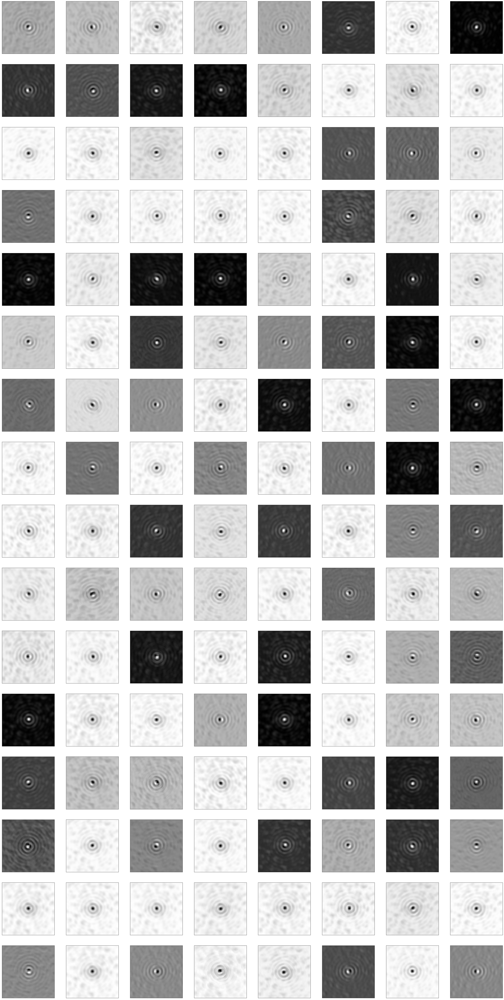

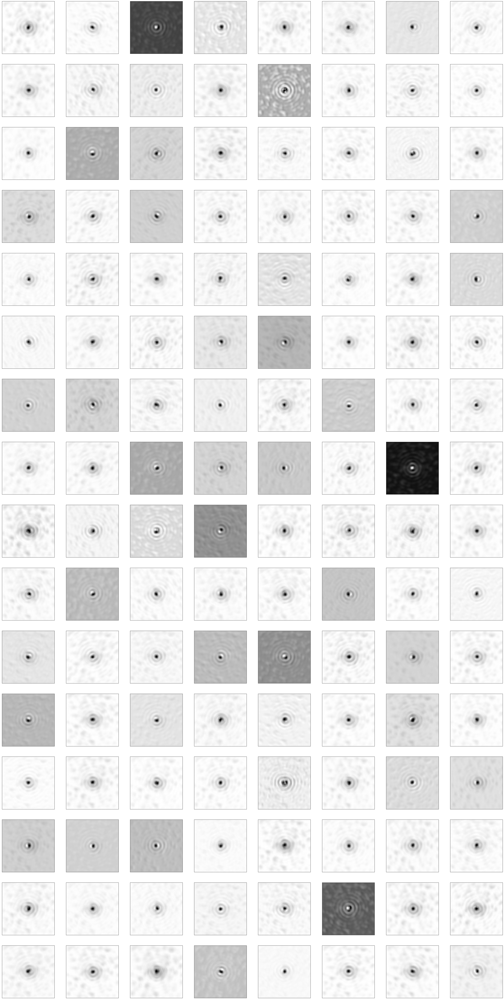

In [245]:
import keras

SUBPLOT_SIZE = 6

# Generate new validation data
dataset.update()
image_of_particle = dataset.resolve()
img = image_of_particle.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 2) # Reshape needed for model input

# Plotting the two input channels (Im() and Re())

input_fig, ax = plt.subplots(1, 2)

input_fig.suptitle("Input image")

ax[0].imshow(image_of_particle[:, :, 0], cmap='gray')
ax[0].set_title("Real (?) part")
ax[0].set_xticks([])
ax[0].set_yticks([])

ax[1].imshow(image_of_particle[:, :, 1], cmap='gray')
ax[1].set_title("Im (?) part")
ax[1].set_xticks([])
ax[1].set_yticks([])

plt.show()

# Plotting all outputs from convolutional layer, each layer is given its own figure

for layer in model.layers:
    if 'conv' not in layer.name: # Ignoring non-convolutional layers
        continue
    
    NUMBER_OF_OUTPUTS = layer.output.shape[3] # Total number of subplots
    SUBPLOT_WIDTH = 8 # Preferably something that divides NUMBER_OF_OUTPUTS
    SUBPLOT_HEIGHT = NUMBER_OF_OUTPUTS // SUBPLOT_WIDTH # Number of rows needed

    # Create a submodel up to a certain layer 
    submodel = keras.Model(inputs=model.inputs, outputs=layer.output)

    # Generate prediction outputs for the submodel
    feature_maps = submodel.predict(img)

    # Plotting all the outputs in a square figure

    output_number = 0
    fig, ax = plt.subplots(SUBPLOT_HEIGHT, SUBPLOT_WIDTH, figsize=(SUBPLOT_WIDTH * SUBPLOT_SIZE, SUBPLOT_HEIGHT * SUBPLOT_SIZE))
    ax = ax.flatten()

    for output_number, axis in zip(range(len(ax)), ax):
        axis.imshow(feature_maps[0, :, :, output_number], cmap='gray')
        ax[output_number].set_xticks([])
        ax[output_number].set_yticks([])
            
    plt.show()

In [246]:
import keras
def visualize_feature_maps(model, image_of_particle, SUBPLOT_SIZE=6, SUBPLOT_WIDTH=8):
    # Plotting the two input channels (Im() and Re())
    input_fig, ax = plt.subplots(1, 2)

    ax[0].imshow(image_of_particle[:, :, 0], cmap='gray')
    ax[0].set_title("Real (?) part")
    ax[0].set_xticks([])
    ax[0].set_yticks([])

    ax[1].imshow(image_of_particle[:, :, 1], cmap='gray')
    ax[1].set_title("Im (?) part")
    ax[1].set_xticks([])
    ax[1].set_yticks([])

    plt.show()

    # Plotting all outputs from convolutional layer, each layer is given its own figure

    img = image_of_particle.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 2) # Reshape needed for model prediction input

    for layer in model.layers:
        if 'conv' not in layer.name: # Ignoring non-convolutional layers
            continue
        
        NUMBER_OF_OUTPUTS = layer.output.shape[3] # Total number of subplots
        SUBPLOT_HEIGHT = NUMBER_OF_OUTPUTS // SUBPLOT_WIDTH # Number of rows needed

        # Create a submodel up to a certain layer 
        submodel = keras.Model(inputs=model.inputs, outputs=layer.output)

        # Generate prediction outputs for the submodel
        feature_maps = submodel.predict(img)

        # Plotting all the outputs in a square figure

        output_number = 0
        fig, ax = plt.subplots(SUBPLOT_HEIGHT, SUBPLOT_WIDTH, figsize=(SUBPLOT_WIDTH * SUBPLOT_SIZE, SUBPLOT_HEIGHT * SUBPLOT_SIZE))
        ax = ax.flatten()

        for output_number, axis in zip(range(len(ax)), ax):
            axis.imshow(feature_maps[0, :, :, output_number], cmap='gray')
            ax[output_number].set_xticks([])
            ax[output_number].set_yticks([])
                
        plt.show()